# Vector Cells: BVCs, OVCs and egocentric field of views [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/TomGeorge1234/RatInABox/blob/dev/demos/vector_cell_demo.ipynb)


In this demo we will play and simulate various types of vector cells. `VectorCells` are cell types which respond to environmental features when the agent is at a particular angle and distance away from them. In the brain there are two famous types of vector cells:  `ObjectVectorCells` respond to objects in the environment and `BoundaryVectorCells` respond to the boundaries of the environment. 

Here's we'll show how to simulate both of these types of cells and then show how to simulate `FieldOfViewOVCs` and `FieldOfViewBVCs` which are vector cells which respond to objects and boundaries in the environment within a certain field of view.

In [1]:
# Install dependencies 
!pip install ratinabox
!pip install scikit-learn

In [2]:
import ratinabox 
from ratinabox.Neurons import FieldOfViewOVCs, ObjectVectorCells, FieldOfViewBVCs, BoundaryVectorCells
from ratinabox import Agent
from ratinabox import Environment
ratinabox.stylize_plots(); ratinabox.autosave_plots=True; ratinabox.figure_directory = "../figures/"

import numpy as np 

#autoreload the libraries
%load_ext autoreload
%autoreload 2

### Initialize Environment, Agent

First we'll make an environment with three objects in it and a dividing wall. Objects have "types" and `ObjectVectorCobject in the centre. 

Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/Environment_2133.png  & .svg


Text(0.5, 0.98, 'An environment with three objects of two different types')

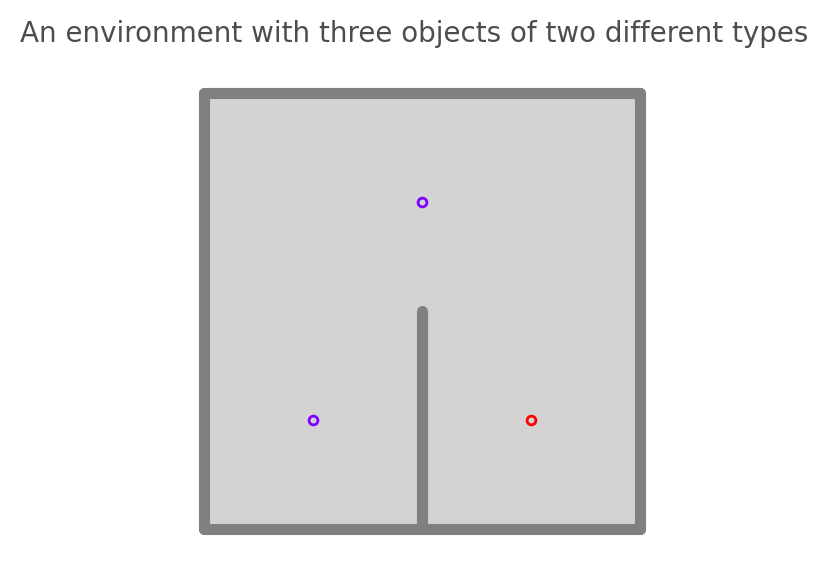

In [3]:
Env = Environment()
Env.add_object(object = np.array([0.25,0.25]), type = 0)
Env.add_object(object = np.array([0.5,0.75]), type = 0)
Env.add_object(object = np.array([0.75,0.25]), type = 1)

Env.add_wall([[0.5,0],[0.5,0.5]])

#See the environment
fig, ax = Env.plot_environment(); fig.suptitle("An environment with three objects of two different types")

### Basic `ObjectVectorCells` and `BoundaryVectorCells` 

- `ObjectVectorCell` : Fires when they detect an object in their tuning distance and angles 
- `BoundaryVectorCell` : These detect the walls in the Envirnoment

By default each cell (BVC or OVC) has a random distance and angle tuning. OVCs (but obviously not BVCs) have an additional preference parameter specifying the type of object (`OVCs.tuning_types`) they respond to.

We can visualise the cells rate maps with the `plot_rate_maps` function. Notice how OVCs respond to objects whereas BVCs respond to walls; each responds preferably at a given angle and tuning distance. 

Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/ObjectVectorCell_ratemaps_2134.png  & .svg
Figure saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/BoundaryVectorCells_ratemaps_2134.png  & .svg


Text(0.5, 0.98, 'Boundary Vector Cells')

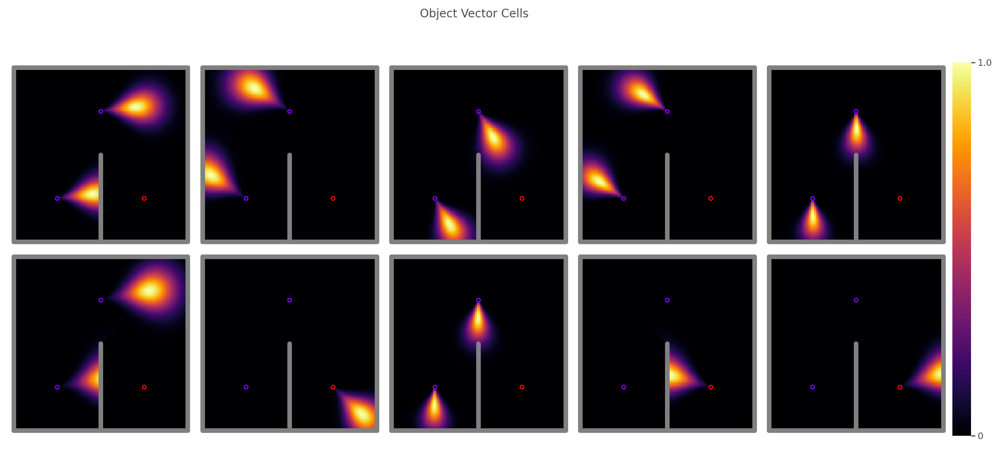

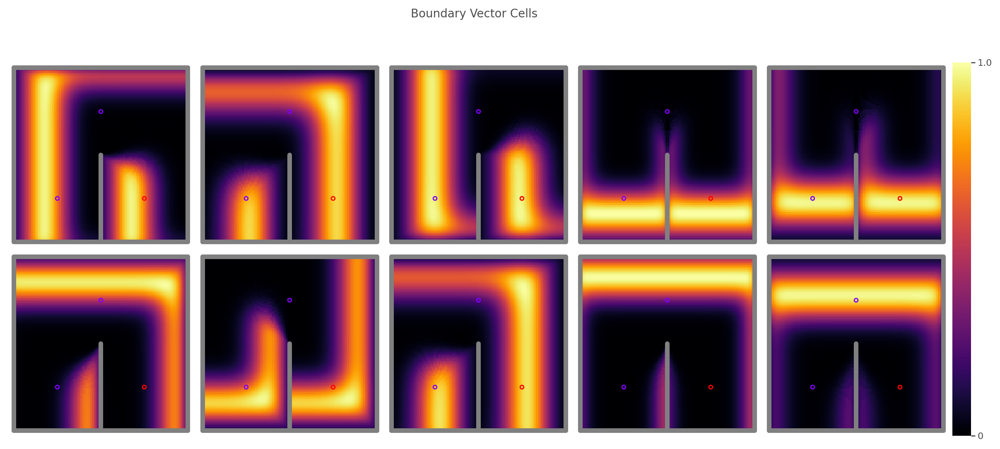

In [5]:
Ag = Agent(Env)

OVCs = ObjectVectorCells(Ag, params={ 'n' : 10}) #as no manifold is mentioned random manifold is used
BVCs = BoundaryVectorCells(Ag, params={ 'n' : 10})

fig, ax = OVCs.plot_rate_map(shape=(2,5)); fig.suptitle('Object Vector Cells')
fig, ax = BVCs.plot_rate_map(shape=(2,5)); fig.suptitle('Boundary Vector Cells')

We can check out the tuning types annd angles etc. 

In [12]:
print(f"Tuning types: {OVCs.tuning_types}")
print(f"Tuning angles: {OVCs.tuning_angles}")
print(f"Tuning distances: {OVCs.tuning_distances}")
print(f"Tuning distance width: {OVCs.sigma_distances}") # distance preference is a Gaussian
print(f"Tuning angle width: {OVCs.sigma_distances}") # angle preference is a Von Mises

Tuning types: [0 0 1 0 1 0 1 1 0 1]
Tuning angles: [5.32377704 0.97309388 2.66247156 0.85929406 5.5925875  0.04306673
 0.55019375 0.55414693 4.77305944 3.15392393]
Tuning distances: [0.07920635 0.08159836 0.19202993 0.15534355 0.23613225 0.07252299
 0.07610276 0.00895067 0.23334872 0.18326253]
Tuning distance width: [0.08660053 0.08679986 0.09600249 0.0929453  0.09967769 0.08604358
 0.0863419  0.08074589 0.09944573 0.09527188]
Tuning angle width: [0.08660053 0.08679986 0.09600249 0.0929453  0.09967769 0.08604358
 0.0863419  0.08074589 0.09944573 0.09527188]


### Displaying the vector cells with respect to the `Agent`
We can use the vector cell function `.display_vector_cells()` to visualise the vector cells in the environment and their firing rates with respect to the position of the agent. 

This can be used to make nice animations. In the following you'll see how the position of each little oval represents the tuning of each vector cell (corroborate these with the OVC rate maps above) and its firing rate is represented by the color. This should increase whenever it cross the object type / boundary it is selective for. This oval is an approximation to the full distribution of the vector cell's tuning curve (this is a Gaussian in distance x a von mises in angle).

In this case we'll visualise the `BoundaryVectorCells` so notice how the firing rate increases when the agent approaches a the boundary at the correct angle.

In [13]:
while Ag.t < 30:
    Ag.update()
    BVCs.update()

Ag.animate_trajectory(t_end=30, speed_up=10, additional_plot_func=BVCs.display_vector_cells)

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/trajectory_2118.mp4


### Ego- and Allocentric 

By default vector cells are allocentric. This means their angular tuning is repect to due-North. However, it is possible to make them egocentric, i.e. their angular tuning is relative to the animal's head direction. This is done by setting the the `'reference_frame'` parameter to `'egocentric'`. 

Since these cells now depend on head direction we may optinally like to smooth the head direction (head direction = velocity smoothed with a decaying expontial kernel), as done here. 

In [15]:
Ag = Agent(Env, params={'head_direction_smoothing_timescale':1.0}) 
BVCs_egocentric = BoundaryVectorCells(Ag, params={ 'n' : 10, 
                                        'reference_frame':'egocentric',})

while Ag.t < 30:
    Ag.update()
    BVCs_egocentric.update()

Ag.animate_trajectory(t_end=30, speed_up=10, additional_plot_func=BVCs_egocentric.display_vector_cells)

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/trajectory_2118_2.mp4


### Field of view `ObjectVectorCells` and BoundaryVectorCells` 

It is possible to imagine that we might initialise _many_ OVCs (or BVCs) and that these could have tuning preferences that are well arranges in order to "tile" the field of view of the `Agent`. This process is automated by the `FieldOfViewOVC` and `FieldOfViewBVCs` subclasses. 

Users provide the distance range and angluar range over which the field of view extends. The parameter `"cell_arrangement"` controls whether the size of the receptive fields is uniform across the field of view (`"uniform_manifold"`) or gets wider with distance (`"diverging_manifold"`) as observed in the brain.

Other than this initialisation they aren't any different to normal OVCs and BVCs. Here's a visualisation for `FieldOfViewOVCs` selective to object type 1. 


In [21]:
Env1 = Environment()
Env1.add_object(object = np.array([0.25,0.25]), type = 0)
Env1.add_object(object = np.array([0.25,0.75]), type = 1)
Env1.add_object(object = np.array([0.75,0.25]), type = 1)
Env1.add_object(object = np.array([0.75,0.75]), type = 0)

Ag = Agent(Env1, params={'head_direction_smoothing_timescale':1.0})

FoV_OVCs = FieldOfViewOVCs(Ag,params={
                            "distance_range": [0.01, 0.4],  # min and max distances the agent can "see"
                            "angle_range": [0,90,],  # angluar FoV in degrees (will be symmetric on both sides, so give range in 0 (forwards) to 180 (backwards)
                            "spatial_resolution": 0.06,  # resolution of each BVC tiling FoV, behaves a bit differently in diverging_manifold
                            "cell_arrangement": "diverging_manifold",
                            "object_tuning_type":1 # each cell has a random object type preference unless we specify here
                            })

while Ag.t < 30: 
    Ag.update()
    FoV_OVCs.update()

Ag.animate_trajectory(t_end=30, speed_up=10, additional_plot_func=FoV_OVCs.display_vector_cells)

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/trajectory_2120.mp4


and here's `FieldOfViewBVCs` organised so as to act like little whisker cells!

In [22]:
Ag = Agent(Env, params={'head_direction_smoothing_timescale':1.0})

whisker_BVCs = FieldOfViewBVCs(Ag,params={
                            "distance_range": [0.1, 0.25],  # min and max distances the agent can "see"
                            "angle_range": [75,105,],  # angluar FoV in degrees (will be symmetric on both sides, so give range in 0 (forwards) to 180 (backwards)
                            "spatial_resolution": 0.02,  # resolution of each BVC tiling FoV, behaves a bit differently in diverging_manifold
                            "cell_arrangement": "diverging_manifold",
                            })

while Ag.t < 30: 
    Ag.update()
    whisker_BVCs.update()

Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=whisker_BVCs.display_vector_cells)

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/trajectory_2120_1.mp4


### Custom Tuning Distances and Angles

One can also pass in a function of their choice to set the appropriate manifolds 

For this they have to follow the following function signature

```python
def create_custom_manifold(**kwargs):
    # do operations
    # ensure  len(mu_d) == len(mu_theta) == len(sigma_d) == len(sigma_theta), this is the number of neurons 

    return mu_distace,mu_angle, sigma_d,sigma_angle

```
where 
- `mu_distance`: distance preferences of the neurons
- `mu_angle`: angular preferences (radians)
- `sigma_d`: distance tunings - variance for the Gaussian 
- `sigma_angle`: angular tunings (radians) - variance for the von miss 


In [23]:
import numpy as np
def create_custom_manifold(**kwargs):

    mu_distance = [0.1, 0.2, 0.3, 0.4, 0.5]
    mu_angle = [0.0, 0.0, 0.0, 0.0, 0.0]

    sigma_distance = [0.1, 0.1, 0.1, 0.1, 0.1]
    _sigma_angle = [0.06, 0.06, 0.06, 0.06, 0.06]
    sigma_angle = [_sigma_angle[i] / mu_distance[i] for i in range(len(_sigma_angle))]

    return mu_distance, mu_angle, sigma_distance, sigma_angle

In [30]:
Env = Environment()
object_pos = Env.sample_positions(n=8,)
for i in range(1):
    Env.add_object(object_pos[i],type="same")
Env.add_wall([[0.5,0],[0.5,0.5]])

Ag = Agent(Env)

# Create a Object Vector Cell object that are EGOCENTRIC with custom manifold
OVCs_custom = ObjectVectorCells(Ag, params={
                            "cell_arrangement": create_custom_manifold,
                            "reference_frame": "egocentric",
                            })


# Run the simulation for 30 seceonds
for i in range(int(30/Ag.dt)):
    Ag.update()
    OVCs_custom.update()

Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=OVCs_custom.display_vector_cells)

Animation saved to /Users/tomgeorge/Documents/RatInABox/figures/21_08_23/trajectory_2122.mp4
